# RL experiment for Φ = 0.1, Ψ = 0.1
At Φ = 0.1, Ψ = 0.1, the gyrotactic particles are expected to form tight clusters due to their relatively weak swimming and fast realignment, such they swimmers align with streamlines. 

In [77]:
%run main.ipynb

The line_profiler extension is already loaded. To reload it, use:
  %reload_ext line_profiler


In [31]:
my_Φ = 0.1 # swimming number = v_s/u_0       
my_Ψ = 0.1  # stability number = B w_0. B is the characteristic time a perturbed cell takes to return 
            # to orientation ka if w = 0. smaller means swimming more aligned with ka. 
my_alpha0 = 1.0 
method = "expSARSA"
eps_decay = True
my_eps0 = 1.0

In [3]:
Q, Σ, smart, naive, hist_R_tot_smart, hist_R_tot_naive, smart_stored_histories, naive_stored_histories, \
        state_action_counter, chosen_actions, avg_Q_hist, initial_coords \
            = training(alpha0=my_alpha0, Φ=my_Φ, Ψ=my_Ψ, method=method, eps0=my_eps0, eps_decay=eps_decay)

In [ ]:
# directory for saving figures files
directory_name = "phi_0d1_psi_0d1_expSARSA"
create_figure_dir(directory_name)

In [30]:
Ne = len(hist_R_tot_naive)
N = 1 if Ne < 1000 else 500 # how many episodes to average over 

fig = go.Figure()
fig.add_trace(go.Scatter(x=np.arange(N,Ne+1), y=moving_average(hist_R_tot_smart,N), mode='lines', name = "Smart"))
fig.add_trace(go.Scatter(x=np.arange(N,Ne+1), y=moving_average(hist_R_tot_naive,N), mode='lines', name = "Naive"))
fig.update_layout(
    title="Total reward vs. episode #",
    xaxis_title="Episode #",
    yaxis_title="Total reward, Rtot",
)
fig.show()
fig.write_image("Figures/" + directory_name + "/total-reward.pdf") # save figure

## Visualize policy
To visualize the actions we will take for each state, we can alculate the matrix Qnorm, which is Q but each of its rows is normalized so as to range from 0 to 1. In this way, we can visualize the best action (column) for each state (row).

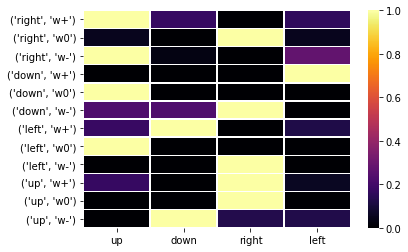

In [20]:
Qnorm = copy.deepcopy(Q)
max_per_row = np.max(Q,1)
min_per_row = np.min(Q,1)
for row in range(Q.shape[0]):
    Qnorm[row,:] = (Qnorm[row,:]-min_per_row[row])/(max_per_row[row]-min_per_row[row])
ax = sns.heatmap(Qnorm, linewidth=0.5, xticklabels = ["up","down","right","left"], yticklabels = product_states, \
                cmap = 'inferno')
plt.savefig("Figures/" + directory_name + "/final-policy.pdf", format="pdf", bbox_inches="tight")
plt.show()

Of course we can also visualize Q directly to a sense of the relative value of the state-action pairs.

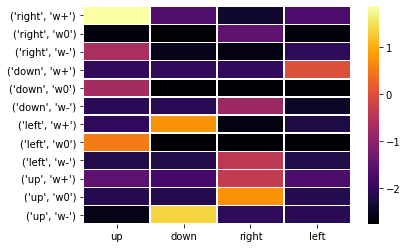

In [18]:
ax = sns.heatmap(Q, linewidth=0.5, xticklabels = ["up","down","right","left"], yticklabels = product_states, \
                cmap = 'inferno')
plt.savefig("Figures/" + directory_name + "/final-policy-unnorm.pdf", format="pdf", \
                                    bbox_inches="tight")

## Plot trajectories for for selected episodes

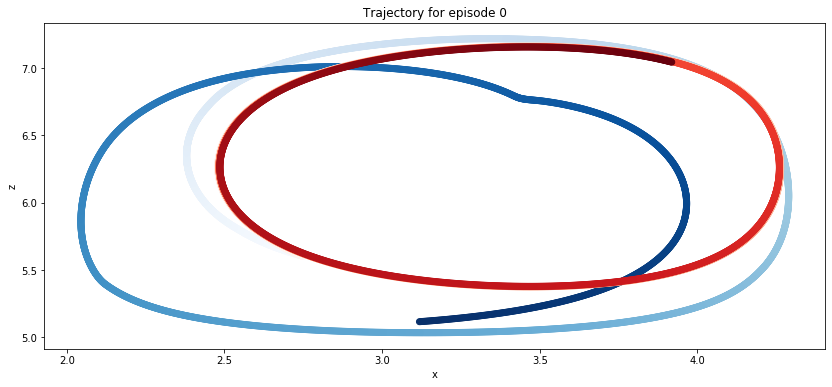

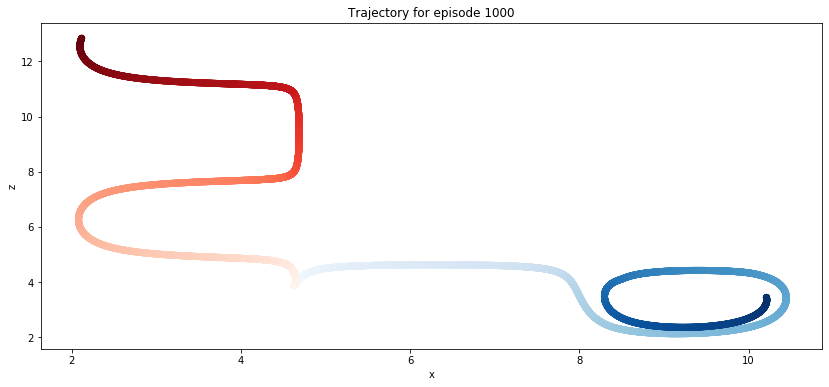

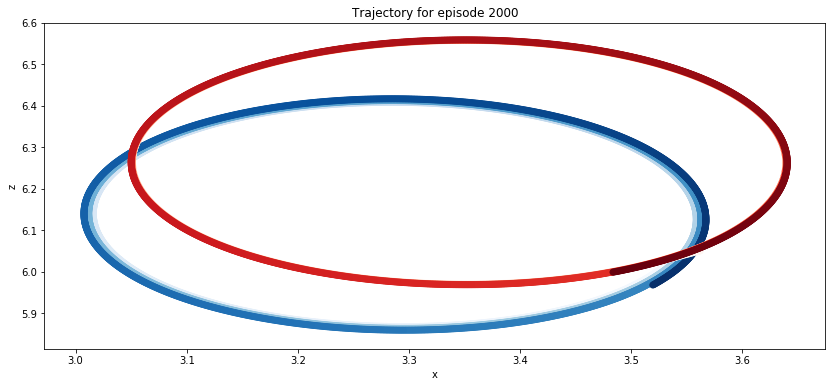

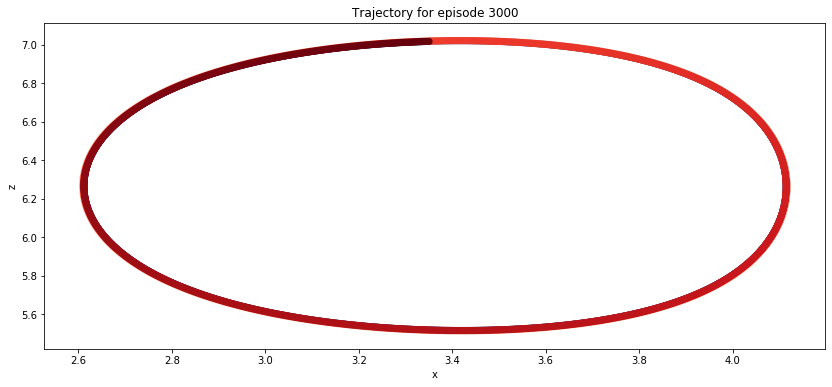

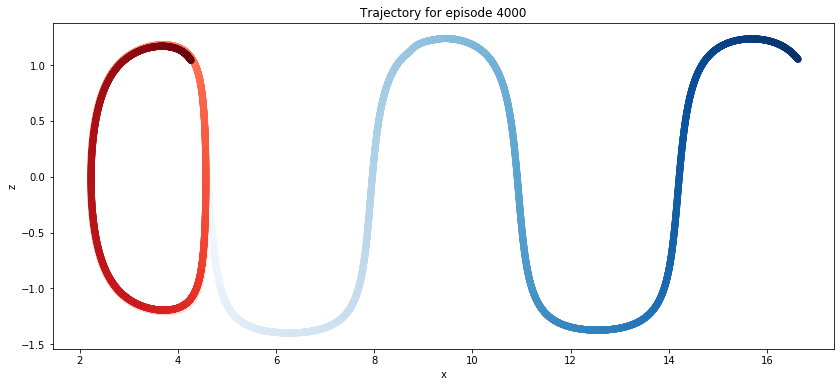

In [25]:
style = "matplotlib" # "plotly" or "matplotlib"
Ns = len(smart.history_X)-1

for i in range(len(smart_stored_histories)):
        ep, smart_history_X_total = smart_stored_histories[i]
        ep, naive_history_X_total = naive_stored_histories[i]

        if i == len(smart_stored_histories) - 1: style = "plotly"
        if style == "plotly":
            fig = go.Figure(go.Scatter(x=smart_history_X_total[:,0], y=smart_history_X_total[:,1],mode='markers',
                name = "smart",
                marker=dict(size=4,
                    color=np.linspace(0,Ns,Ns+1), #set color equal to a variable
                    colorscale='blues', # one of plotly colorscales
                    showscale=True,
                    colorbar=dict(title="Smart")
                )))
            fig.add_trace(go.Scatter(x=naive_history_X_total[:,0], y=naive_history_X_total[:,1],mode='markers',
                name = "naive",
                marker=dict(size=4,
                    color=np.linspace(0,Ns,Ns+1), #set color equal to a variable
                    colorscale='reds', # one of plotly colorscales
                    showscale=True,
                    colorbar=dict(title="Naive",x=1.15)
                )))
            fig.update_layout(
                title="Trajectory for episode " + str(ep),
                xaxis_title="$x$",
                yaxis_title="$z$",
                legend_orientation="h",
                showlegend = False
            )
            fig.show()
        else:
            plt.figure(figsize=(14,6))
            plt.scatter(smart_history_X_total[:,0], smart_history_X_total[:,1], c=np.linspace(0,Ns,Ns+1), \
                        cmap='Blues')
            plt.scatter(naive_history_X_total[:,0], naive_history_X_total[:,1], c=np.linspace(0,Ns,Ns+1), \
                        cmap='Reds')
            plt.xlabel("x")
            plt.ylabel("z")
            plt.title("Trajectory for episode " + str(ep))
            plt.show()

if i == len(smart_stored_histories) - 1: fig.write_image("Figures/" + directory_name + "/final-epsiode.pdf") 

## Convergence of Q-learning
Q-learning convergences in the limit that all state-action pairs have been visited infinitely many times. The heat map shown below shows us how often each state has been visited relative to the total number of visits. 

The state that was visited least had 9139.0 encounters, which is 0.05% of the total states visited


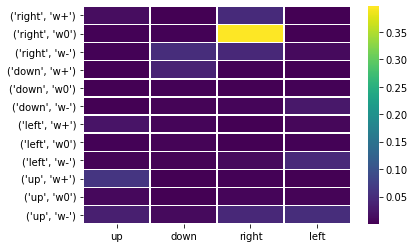

In [28]:
print("The state that was visited least had " + str(np.min(state_action_counter)) + " encounters, which is " + \
     str(round(np.min(state_action_counter)/np.sum(state_action_counter)*100,2)) + "% of the total states visited")

# heatmap normalized by total number of encounters
ax = sns.heatmap(state_action_counter/np.sum(state_action_counter), linewidth=0.5, \
            xticklabels = ["up","down","right","left"], yticklabels = product_states, cmap = 'viridis')

## Trial 2
How can we improve our performance? First, let's try $N_s = 2000$ since these motions are highly periodic, so it may afford us to sacrifice steps within in episode to conduct more episodes (e.g. $N_e = 10,000$). Let's also try a less greedy approach to maximize exploration since it seems only a few states are being visited. We can achieve this by using polynomial decay rather than linear decay of $\epsilon$. 

In [40]:
my_Ns = 2000
my_Ne = 10000
my_alpha0 = 1.0 
method = "expSARSA"
eps_decay = True
my_eps0 = 1.0
my_omega = 0.5

In [41]:
Q, Σ, smart, naive, hist_R_tot_smart, hist_R_tot_naive, smart_stored_histories, naive_stored_histories, \
        state_action_counter, chosen_actions, avg_Q_hist, initial_coords, theta_history \
            = training(alpha0=my_alpha0, Ns = my_Ns, Ne = my_Ne, Φ=my_Φ, Ψ=my_Ψ, method=method, \
                       eps0=my_eps0, eps_decay=eps_decay, omega=my_omega)

In [44]:
# directory for saving figures files
directory_name = "phi_0d1_psi_0d1_expSARSA_Ne_10k_Ns_2k_eps_decay_omega_0d85"
create_figure_dir(directory_name)

First we want to see the performance under set of training parameters:

In [66]:
# check performance after training this agent with this set of parameters
plot_total_reward_vs_episode(hist_R_tot_smart, hist_R_tot_naive, N = 1500)

ValueError: 
For some reason plotly.py was unable to communicate with the
local orca server process, even though the server process seems to be running.

Please review the process and connection information below:

orca status
-----------
    state: running
    executable: /Users/jeremuybinagia/opt/anaconda3/bin/orca
    version: 1.2.1
    port: 62396
    pid: 5540
    command: ['/Users/jeremuybinagia/opt/anaconda3/bin/orca', 'serve', '-p', '62396', '--plotly', '/Users/jeremuybinagia/opt/anaconda3/lib/python3.7/site-packages/plotly/package_data/plotly.min.js', '--graph-only', '--mathjax', 'https://cdnjs.cloudflare.com/ajax/libs/mathjax/2.7.5/MathJax.js']




The performance is better but still subobptimal. Did we improve on how often each state-action pair was visted?

The state that was visited least had 51352.0 encounters, which is 0.26% of the total states visited
Pure exploration would have each pair visited  416667.0  times, i.e.  2.08 % of the time


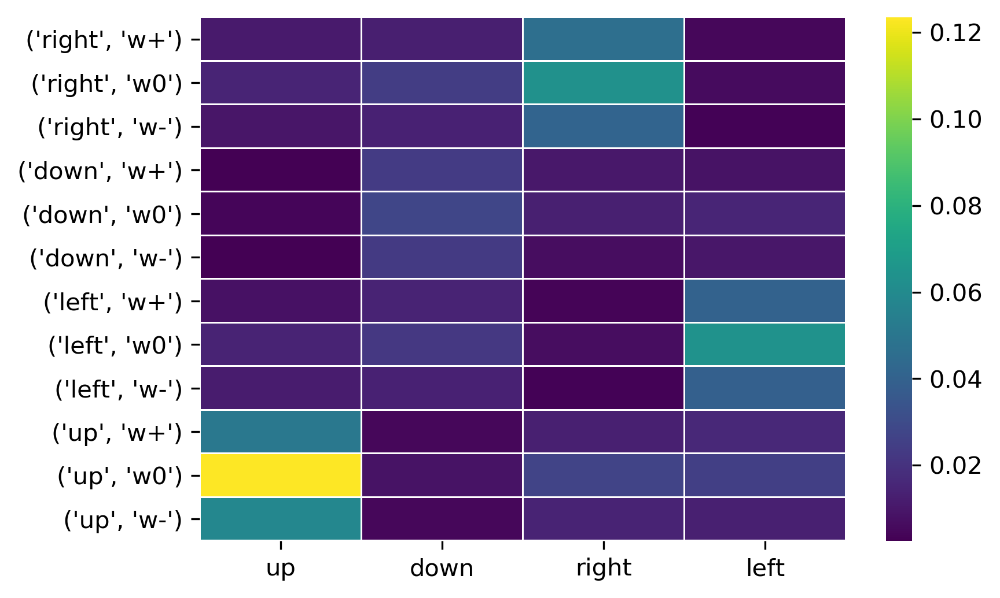

In [64]:
print("The state that was visited least had " + str(np.min(state_action_counter)) + " encounters, which is " + \
     str(round(np.min(state_action_counter)/np.sum(state_action_counter)*100,2)) + "% of the total states visited")
print("Pure exploration would have each pair visited ", np.round(np.sum(state_action_counter)/N_actions/N_states),\
      " times, i.e. ", np.round(1/N_actions/N_states*100,2), "% of the time")
# heatmap normalized by total number of encountersb
ax = sns.heatmap(state_action_counter/np.sum(state_action_counter), linewidth=0.5, \
            xticklabels = ["up","down","right","left"], yticklabels = product_states, cmap = 'viridis')

Compared to before, we are doing a much better job in regards to exploration. note that given there is stochasticity in this environment, we may want to operate at a smaller learning rate. 

In [67]:
my_alpha0 = 0.1
Q, Σ, smart, naive, hist_R_tot_smart, hist_R_tot_naive, smart_stored_histories, naive_stored_histories, \
        state_action_counter, chosen_actions, avg_Q_hist, initial_coords, theta_history \
            = training(alpha0=my_alpha0, Ns = my_Ns, Ne = my_Ne, Φ=my_Φ, Ψ=my_Ψ, method=method, \
                       eps0=my_eps0, eps_decay=eps_decay, omega=my_omega)

In [68]:
# directory for saving figures files
directory_name = "phi_0d1_psi_0d1_expSARSA_Ne_10k_Ns_2k_eps_decay_omega_0d85_alpha_0d1"
create_figure_dir(directory_name)

In [70]:
# check performance after training this agent with this set of parameters
plot_total_reward_vs_episode(hist_R_tot_smart, hist_R_tot_naive, N = 500)

ValueError: 
For some reason plotly.py was unable to communicate with the
local orca server process, even though the server process seems to be running.

Please review the process and connection information below:

orca status
-----------
    state: running
    executable: /Users/jeremuybinagia/opt/anaconda3/bin/orca
    version: 1.2.1
    port: 62396
    pid: 5540
    command: ['/Users/jeremuybinagia/opt/anaconda3/bin/orca', 'serve', '-p', '62396', '--plotly', '/Users/jeremuybinagia/opt/anaconda3/lib/python3.7/site-packages/plotly/package_data/plotly.min.js', '--graph-only', '--mathjax', 'https://cdnjs.cloudflare.com/ajax/libs/mathjax/2.7.5/MathJax.js']




This seemed to behoove us, so let's try decreasing it further:

In [71]:
my_alpha0 = 0.05
Q, Σ, smart, naive, hist_R_tot_smart, hist_R_tot_naive, smart_stored_histories, naive_stored_histories, \
        state_action_counter, chosen_actions, avg_Q_hist, initial_coords, theta_history \
            = training(alpha0=my_alpha0, Ns = my_Ns, Ne = my_Ne, Φ=my_Φ, Ψ=my_Ψ, method=method, \
                       eps0=my_eps0, eps_decay=eps_decay, omega=my_omega)

In [72]:
# directory for saving figures files
directory_name = "phi_0d1_psi_0d1_expSARSA_Ne_10k_Ns_2k_eps_decay_omega_0d85_alpha_0d05"
create_figure_dir(directory_name)

In [75]:
# check performance after training this agent with this set of parameters
plot_total_reward_vs_episode(hist_R_tot_smart, hist_R_tot_naive, N = 1500)

ValueError: 
For some reason plotly.py was unable to communicate with the
local orca server process, even though the server process seems to be running.

Please review the process and connection information below:

orca status
-----------
    state: running
    executable: /Users/jeremuybinagia/opt/anaconda3/bin/orca
    version: 1.2.1
    port: 62396
    pid: 5540
    command: ['/Users/jeremuybinagia/opt/anaconda3/bin/orca', 'serve', '-p', '62396', '--plotly', '/Users/jeremuybinagia/opt/anaconda3/lib/python3.7/site-packages/plotly/package_data/plotly.min.js', '--graph-only', '--mathjax', 'https://cdnjs.cloudflare.com/ajax/libs/mathjax/2.7.5/MathJax.js']




It's unclear if convergence has been obtained, so we can continue to run under this parameter set: 

In [78]:
my_Q = Q
Q, Σ, smart, naive, hist_R_tot_smart, hist_R_tot_naive, smart_stored_histories, naive_stored_histories, \
        state_action_counter, chosen_actions, avg_Q_hist, initial_coords, theta_history \
            = training(alpha0=my_alpha0, Ns = my_Ns, Ne = my_Ne, Φ=my_Φ, Ψ=my_Ψ, method=method, \
                       eps0=my_eps0, eps_decay=eps_decay, omega=my_omega, Qin=my_Q)

In [ ]:
# check performance after training this agent with this set of parameters
plot_total_reward_vs_episode(hist_R_tot_smart, hist_R_tot_naive, N = 1000)

Even still, we do not seem to be converging to a clear final value. Let's restart with a smaller learning rate again. We can increase $N_s$ to enable more updates to compensate for the smaller learning rate. 

In [85]:
my_alpha0 = 0.025
my_Ns = 4000 
Q, Σ, smart, naive, hist_R_tot_smart, hist_R_tot_naive, smart_stored_histories, naive_stored_histories, \
        state_action_counter, chosen_actions, avg_Q_hist, initial_coords, theta_history \
            = training(alpha0=my_alpha0, Ns = my_Ns, Ne = my_Ne, Φ=my_Φ, Ψ=my_Ψ, method=method, \
                       eps0=my_eps0, eps_decay=eps_decay, omega=my_omega)

In [86]:
# directory for saving figures files
directory_name = "phi_0d1_psi_0d1_alpha_0d025"
create_figure_dir(directory_name)

In [90]:
# check performance after training this agent with this set of parameters
plot_total_reward_vs_episode(hist_R_tot_smart, hist_R_tot_naive, N = 2000)

ValueError: 
For some reason plotly.py was unable to communicate with the
local orca server process, even though the server process seems to be running.

Please review the process and connection information below:

orca status
-----------
    state: running
    executable: /Users/jeremuybinagia/opt/anaconda3/bin/orca
    version: 1.2.1
    port: 62396
    pid: 5540
    command: ['/Users/jeremuybinagia/opt/anaconda3/bin/orca', 'serve', '-p', '62396', '--plotly', '/Users/jeremuybinagia/opt/anaconda3/lib/python3.7/site-packages/plotly/package_data/plotly.min.js', '--graph-only', '--mathjax', 'https://cdnjs.cloudflare.com/ajax/libs/mathjax/2.7.5/MathJax.js']




In [91]:
plot_learning_gain(hist_R_tot_smart, hist_R_tot_naive, N = 2000)

ValueError: 
For some reason plotly.py was unable to communicate with the
local orca server process, even though the server process seems to be running.

Please review the process and connection information below:

orca status
-----------
    state: running
    executable: /Users/jeremuybinagia/opt/anaconda3/bin/orca
    version: 1.2.1
    port: 62396
    pid: 5540
    command: ['/Users/jeremuybinagia/opt/anaconda3/bin/orca', 'serve', '-p', '62396', '--plotly', '/Users/jeremuybinagia/opt/anaconda3/lib/python3.7/site-packages/plotly/package_data/plotly.min.js', '--graph-only', '--mathjax', 'https://cdnjs.cloudflare.com/ajax/libs/mathjax/2.7.5/MathJax.js']




## Selected trajectories

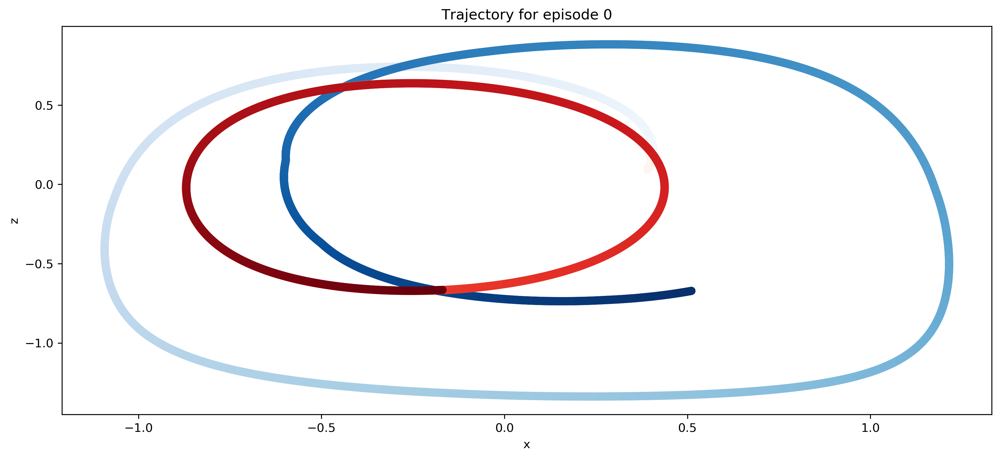

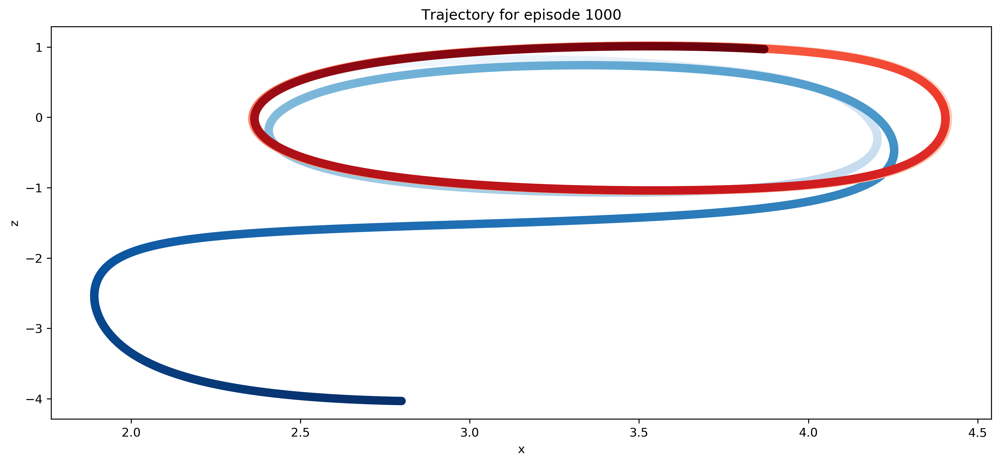

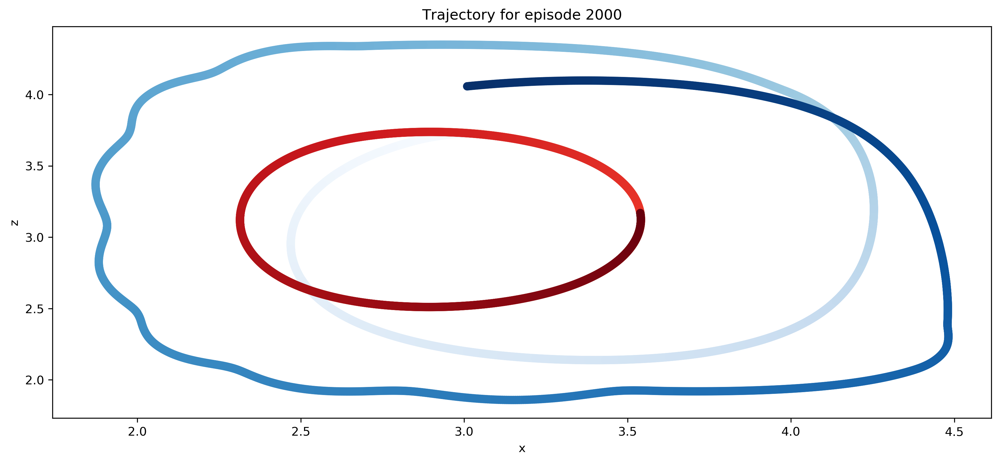

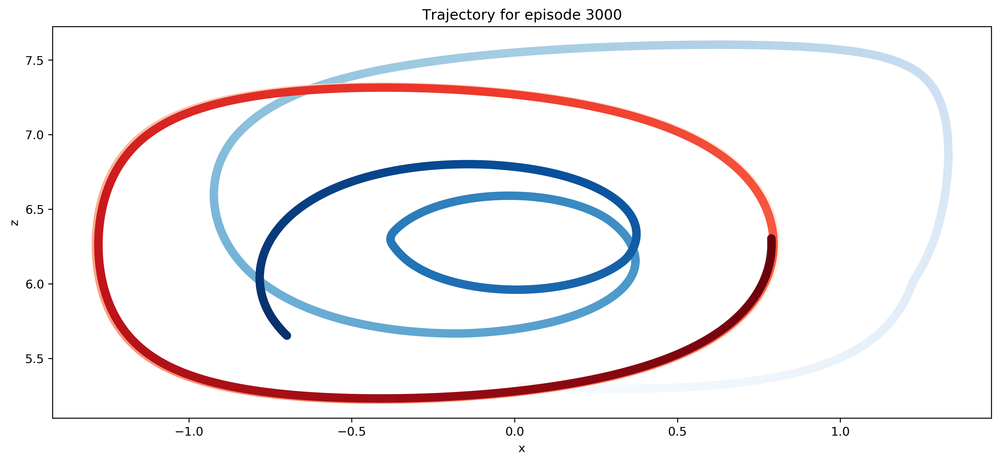

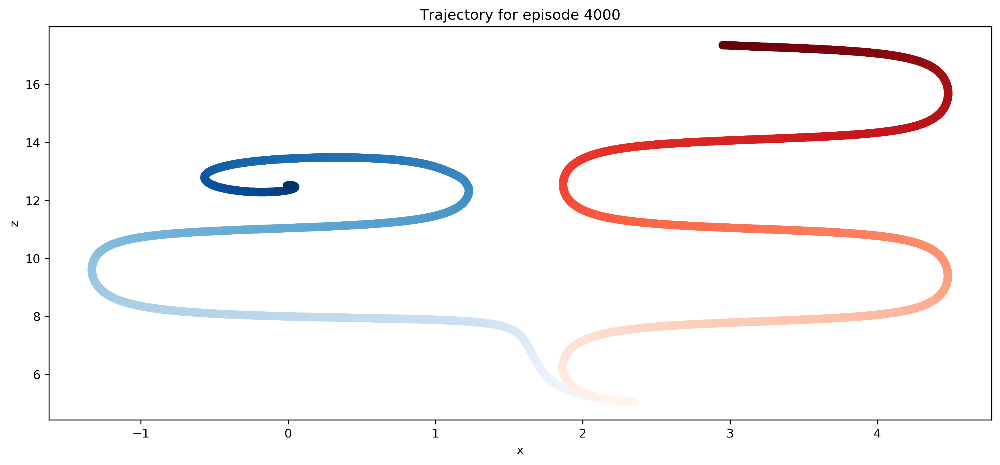

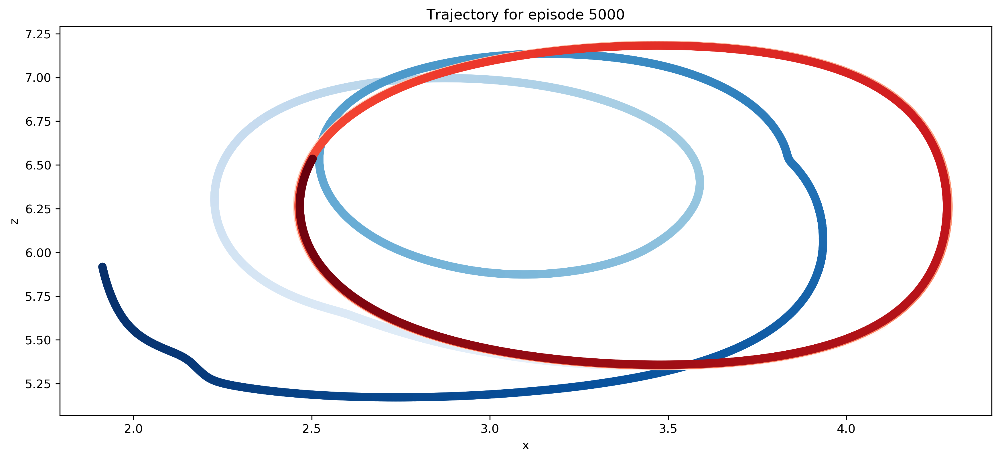

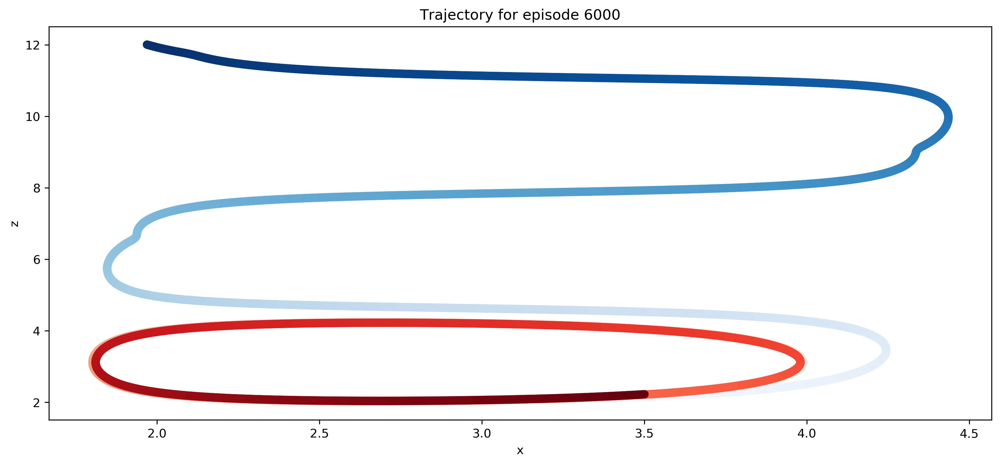

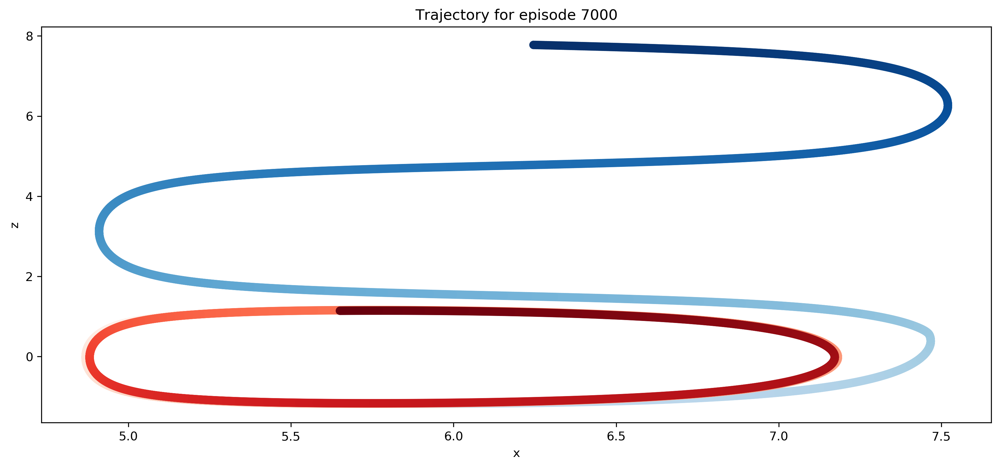

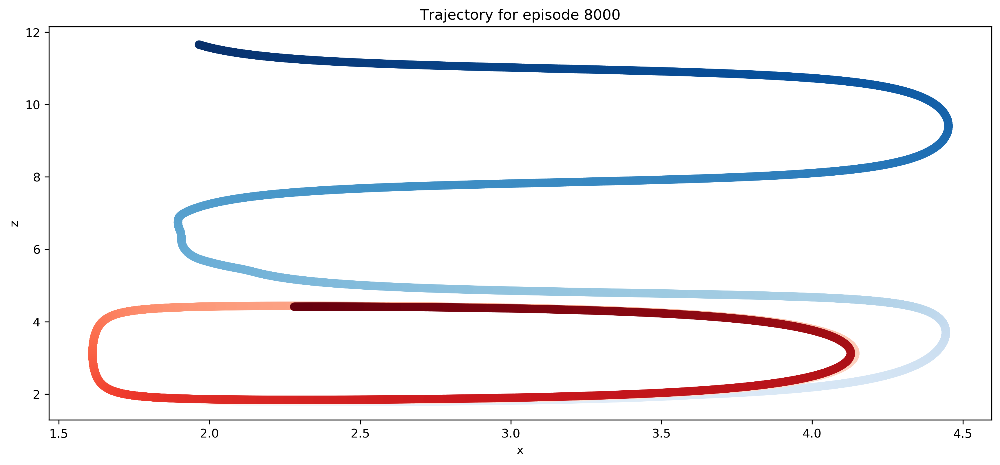

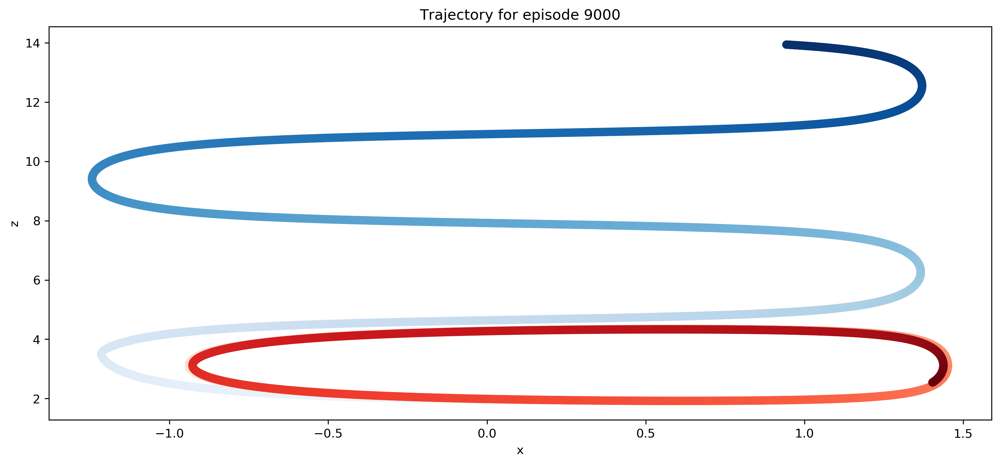

ValueError: 
For some reason plotly.py was unable to communicate with the
local orca server process, even though the server process seems to be running.

Please review the process and connection information below:

orca status
-----------
    state: running
    executable: /Users/jeremuybinagia/opt/anaconda3/bin/orca
    version: 1.2.1
    port: 62396
    pid: 5540
    command: ['/Users/jeremuybinagia/opt/anaconda3/bin/orca', 'serve', '-p', '62396', '--plotly', '/Users/jeremuybinagia/opt/anaconda3/lib/python3.7/site-packages/plotly/package_data/plotly.min.js', '--graph-only', '--mathjax', 'https://cdnjs.cloudflare.com/ajax/libs/mathjax/2.7.5/MathJax.js']




In [92]:
plot_select_trajectories(smart_stored_histories, naive_stored_histories)

## Learned policy

To visualize the policy learned in this case, we can alculate the matrix Qnorm, which is Q but each of its rows is normalized so as to range from 0 to 1. In this way, we can visualize the best action (column) for each state (row).

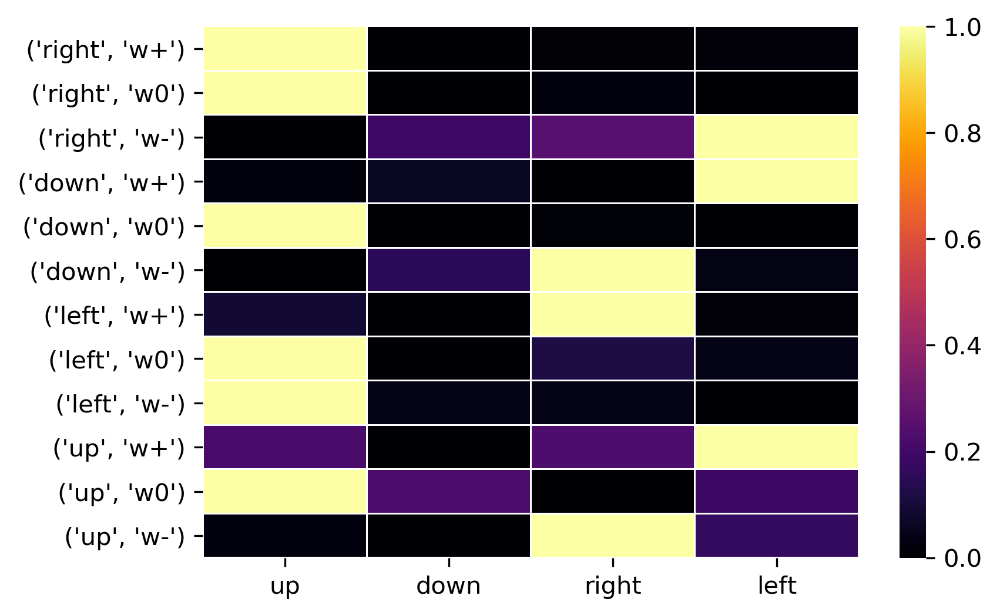

In [94]:
# plt.figure(figsize=(3,2))
Qnorm = copy.deepcopy(Q)
max_per_row = np.max(Q,1)
min_per_row = np.min(Q,1)
for row in range(Q.shape[0]):
    Qnorm[row,:] = (Qnorm[row,:]-min_per_row[row])/(max_per_row[row]-min_per_row[row])
ax = sns.heatmap(Qnorm, linewidth=0.5, xticklabels = ["up","down","right","left"], yticklabels = product_states, \
                cmap = 'inferno')
plt.savefig("Figures/" + directory_name + "/final-policy.pdf", format="pdf", bbox_inches="tight")
plt.show()
# print(Q)
# print(Qnorm)

Of course we can also visualize Q directly to a sense of the relative value of the state-action pairs.

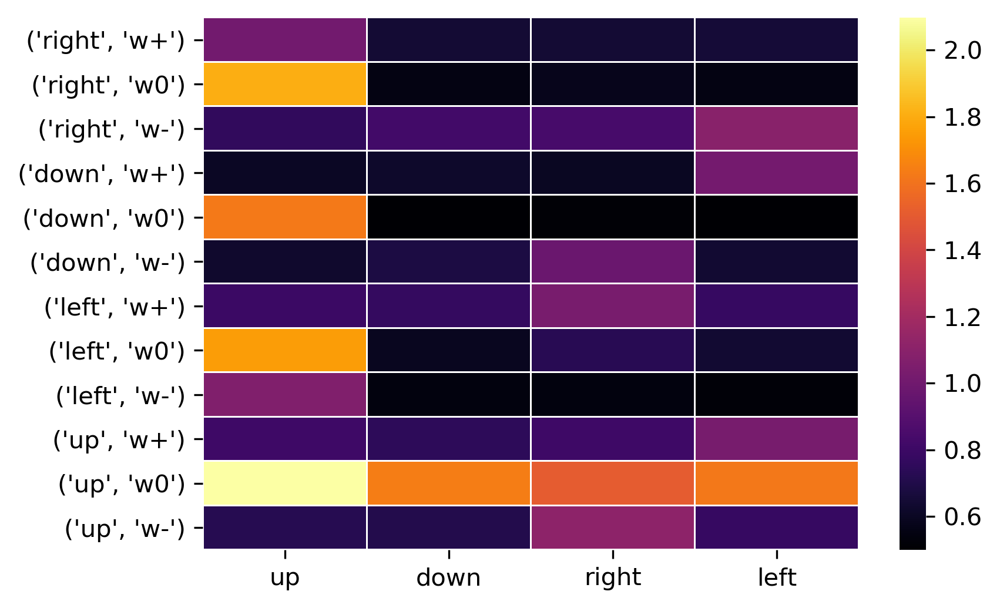

In [93]:
ax = sns.heatmap(Q, linewidth=0.5, xticklabels = ["up","down","right","left"], yticklabels = product_states, \
                cmap = 'inferno')
plt.savefig("Figures/" + directory_name + "/final-policy-unnorm.pdf", format="pdf",  bbox_inches="tight")

Another way we can visualize the "optimal" policy is to overlay the actions taken on the periodic flow field:

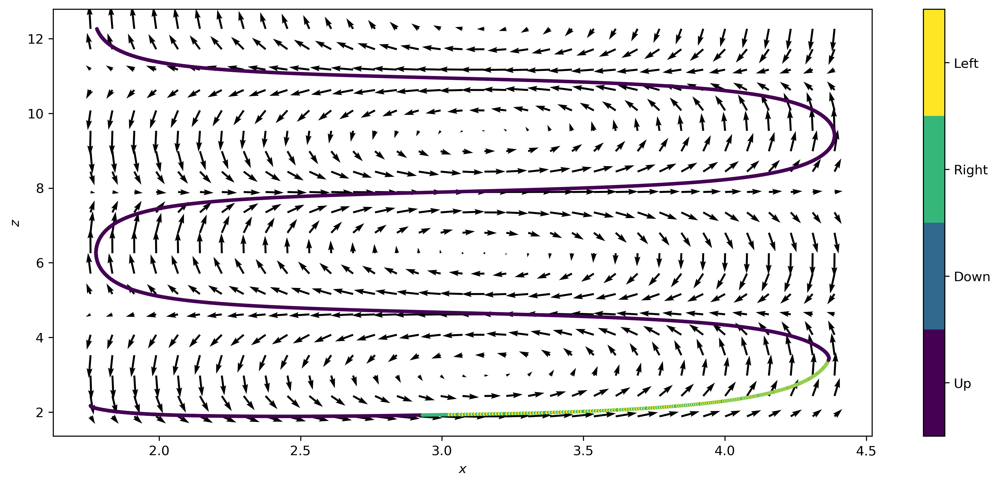

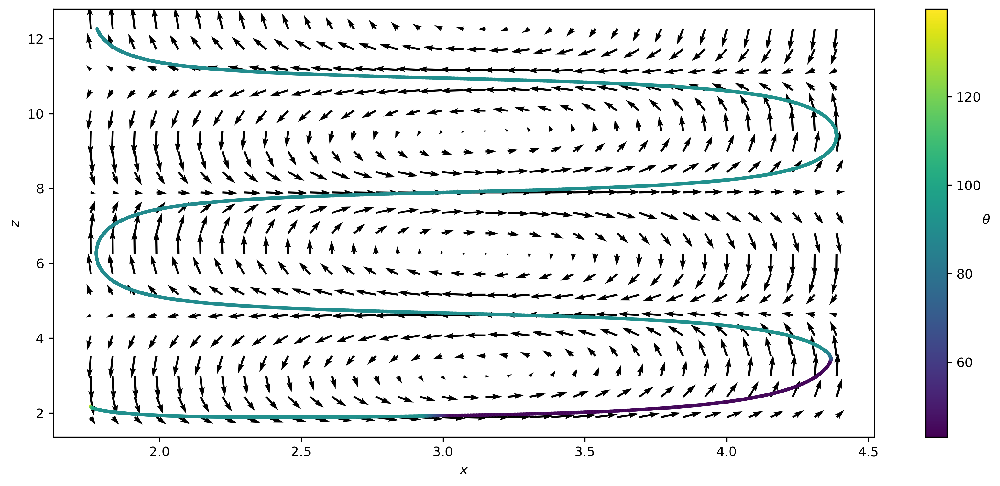

In [113]:
# create underlying quiver plot
plt.figure(figsize=(14,6))
history_X = np.array(smart.history_X_total)
x = np.linspace(np.min(history_X[1:,0]), np.max(history_X[1:,0]), 35)
z = np.linspace(np.min(history_X[1:,1]), np.max(history_X[1:,1]), 20)
X, Z = np.meshgrid(x, z)
ux, uz, w = tgv(X, Z)
plt.quiver(X, Z, ux, uz)

# create scatter plot for policy
cmap = plt.get_cmap('viridis', 4)
ax = plt.scatter(history_X[1:,0], history_X[1:,1],s=3,c=chosen_actions[:], cmap=cmap, \
                 vmin = -.5, vmax = 3.5)
cbar = plt.colorbar(ticks=np.arange(0,4))
cbar.ax.set_yticklabels(['Up', 'Down', 'Right','Left']) 
plt.xlabel(r'$x$')
plt.ylabel(r'$z$')
plt.savefig("Figures/" + directory_name + "/final-ep-actions.pdf", format="pdf", bbox_inches="tight")
plt.show()

# create underlying quiver plot
plt.figure(figsize=(14,6))
x = np.linspace(np.min(history_X[1:,0]), np.max(history_X[1:,0]), 35)
z = np.linspace(np.min(history_X[1:,1]), np.max(history_X[1:,1]), 20)
X, Z = np.meshgrid(x, z)
ux, uz, w = tgv(X, Z)
plt.quiver(X, Z, ux, uz)

# create scatter plot for policy
ax = plt.scatter(history_X[1:tf+1,0], history_X[1:tf+1,1],s=3,c=theta_history[:]/np.pi*180)
cbar = plt.colorbar()
cbar.set_label(r'$\theta$',rotation=180)
plt.xlabel(r'$x$')
plt.ylabel(r'$z$')
plt.savefig("Figures/" + directory_name + "/final-ep-theta.pdf", format="pdf", bbox_inches="tight")
plt.show()

From the above, we see that the swimmer is able to obtain a nearly perfect orientation upward once it reaches its equilibrium trajectory (at which point it merely maintains a constant steering upward). What is perhaps more interesting is that to reach this point, it must oscillate steering left and right to maintain an ~45 degree angle which presumably aids it in reaching this final stable trajectory. This is examined in closer detail below:

Focusing on the first 1000 steps: 

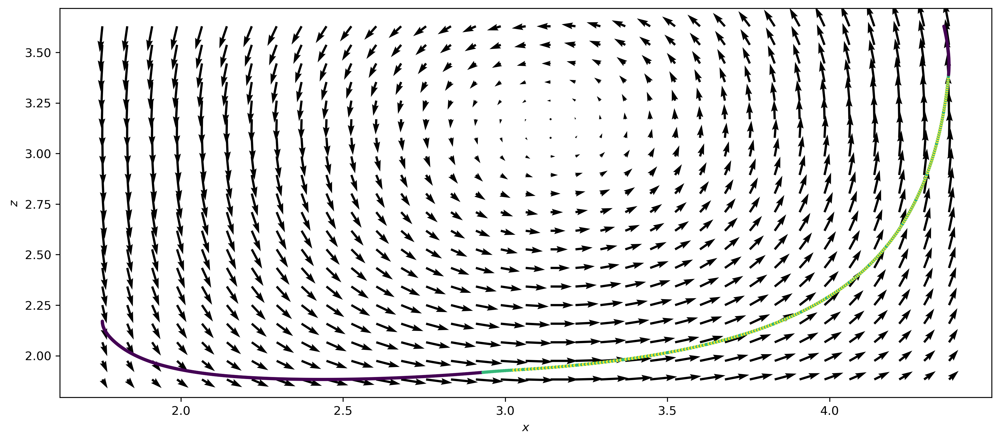

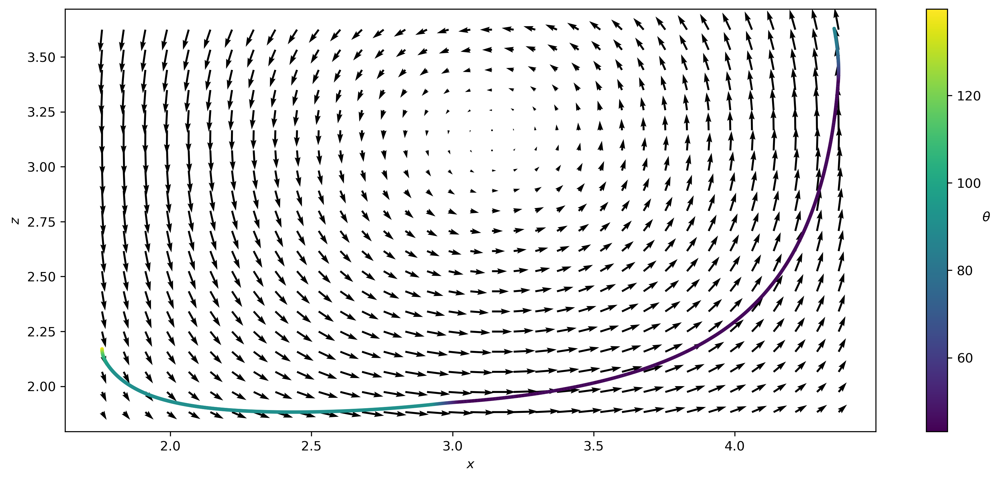

In [118]:
tf = int(history_X[1:,:].shape[0]/4) # define final time 

# create underlying quiver plot
plt.figure(figsize=(14,6))
x = np.linspace(np.min(history_X[1:tf+1,0]), np.max(history_X[1:tf+1,0]), 35)
z = np.linspace(np.min(history_X[1:tf+1,1]), np.max(history_X[1:tf+1,1]), 20)
X, Z = np.meshgrid(x, z)
ux, uz, w = tgv(X, Z)
plt.quiver(X, Z, ux, uz)

# create scatter plot for policy
ax = plt.scatter(history_X[1:tf+1,0], history_X[1:tf+1,1],s=3,c=chosen_actions[:tf], cmap=cmap, \
                 vmin = -.5, vmax = 3.5)
plt.xlabel(r'$x$')
plt.ylabel(r'$z$')
plt.savefig("Figures/" + directory_name + "/final-ep-actions.pdf", format="pdf", bbox_inches="tight")
plt.show()

# create underlying quiver plot
plt.figure(figsize=(14,6))
x = np.linspace(np.min(history_X[1:tf,0]), np.max(history_X[1:tf,0]), 35)
z = np.linspace(np.min(history_X[1:tf,1]), np.max(history_X[1:tf,1]), 20)
X, Z = np.meshgrid(x, z)
ux, uz, w = tgv(X, Z)
plt.quiver(X, Z, ux, uz)

# create scatter plot for policy
ax = plt.scatter(history_X[1:tf+1,0], history_X[1:tf+1,1],s=3,c=theta_history[:tf]/np.pi*180)
cbar = plt.colorbar()
cbar.set_label(r'$\theta$',rotation=180)
plt.xlabel(r'$x$')
plt.ylabel(r'$z$')
plt.savefig("Figures/" + directory_name + "/final-ep-theta.pdf", format="pdf", bbox_inches="tight")
plt.show()